# **EuroSAT : Land Use and Land Cover Classification with Sentinel-2**


# **Clone repository**

In [ ]:
!git clone https://github.com/pauldamsa/Eurosat-Project.git

Cloning into 'satellite_project'...
remote: Enumerating objects: 8, done.
remote: Counting objects: 100% (8/8), done.
remote: Compressing objects: 100% (8/8), done.
remote: Total 27021 (delta 0), reused 0 (delta 0), pack-reused 27013
Receiving objects: 100% (27021/27021), 88.00 MiB | 36.80 MiB/s, done.
Checking out files: 100% (27005/27005), done.


# **Import Packages**

In [ ]:
# Seed value
seed_value= 0
 
# 1. Set `PYTHONHASHSEED` environment variable at a fixed value
import os
os.environ['PYTHONHASHSEED']=str(seed_value)
 
# 2. Set `python` built-in pseudo-random generator at a fixed value
import random
random.seed(seed_value)
 
# 3. Set `numpy` pseudo-random generator at a fixed value
import numpy as np
np.random.seed(seed_value)
 
# 4. Set `tensorflow` pseudo-random generator at a fixed value
import tensorflow as tf
tf.random.set_seed(seed_value)
 
# 5. Configure a new global `tensorflow` session
session_conf = tf.compat.v1.ConfigProto(intra_op_parallelism_threads=1, inter_op_parallelism_threads=1)
sess = tf.compat.v1.Session(graph=tf.compat.v1.get_default_graph(), config=session_conf)
tf.compat.v1.keras.backend.set_session(sess)

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint
from sklearn import metrics

import os
import pandas as pd
import numpy as np
import seaborn as sns
import math 
import matplotlib.pyplot as plt
import plotly.graph_objects as go

import cv2

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



# **Load Data**

In [ ]:
class Image:
  """
    This class will be used for mantaining informations about an image
  """
  def __init__(self, category_name):

    # Name of person
    self.category_name = category_name

    # A list with images of the person
    self.category_images = []
  
  def getCategoryName(self):
    return self.category_name

  def getCategoryImages(self):
    return self.category_images
  
  def addImage(self, image):
    """
      This function is used for adding an image with person to his/her list

      Arguments:
        image: the image we want to add (numpy array)
    """
    self.category_images.append(image)

def testImageClass():
  """
    This function is used for testing the Image class
  """
  img = Image("Highway")

  assert img.getCategoryName() == "Highway"
  assert img.getCategoryName() != "awd"
  assert len(img.getCategoryImages()) == 0

  img.addImage(3)
  assert len(img.getCategoryImages()) == 1

testImageClass()

class RepositoryImages:
  """
    This class will be used for storing the images
  """
  def __init__(self):

    # A dictionary in this form {category: Image(category, category_images) }
    self.images = {}

  def getAllImages(self):
    """
      This function is used for getting all images 

      Return:
        A list with all images from dict that contains Image objects
    """
    return list(self.images.values())
  
  def find(self, category):
    """
      This function is used for getting the images of a category

      Arguments:
        category: a string which represents the name of the category that we want to find
      
      Return:
        A object Image
    """
    return self.images[category]
  
  def read(self, path_to_dataset):
    """
      This function is used for reading the images from directories

      Arguments:
        path_to_dataset: the path where the images are stored
    """
    directories = os.listdir(path_to_dataset)

    self.images = {}
    print("Total directories: " +str(len(directories)))

    # Iterate thorugh directories of path_to_dataset directory
    for directory in directories:

      # Get the name of each directory
      name_of_images = os.listdir(path_to_dataset + directory)
      print("Current directory: " + directory + " " + str(len(name_of_images)))

      # Iterate through images
      for name_of_image in name_of_images:

        # If the image is already in dictionary
        if directory in self.images.keys():

          # Read the image
          image = cv2.imread(path_to_dataset + directory + "/" + name_of_image)

          # Add new image 
          self.images[directory].addImage(image)

        else:
          # Read the image
          image = Image(directory)
          image.addImage(cv2.imread(path_to_dataset + directory + "/" + name_of_image))
          self.images[directory] = image

def testRepository():
  assert len(repo.getAllImages()) == 10

In [ ]:
repository = RepositoryImages()
repository.read("/content/Eurosat-Project/images/")

Total directories: 10
Current directory: AnnualCrop 3000
Current directory: Industrial 2500
Current directory: PermanentCrop 2500
Current directory: Pasture 2000
Current directory: Residential 3000
Current directory: SeaLake 3000
Current directory: HerbaceousVegetation 3000
Current directory: River 2500
Current directory: Forest 3000
Current directory: Highway 2500


In [ ]:
class Service:
  """
    This class will be used for working with the while database of images
  """
  def __init__(self, repo):
    self.repo = repo
  
  def getAllImages(self):
    """
      This function is used for getting all images

      Return:
        A list with all images
    """
    return self.repo.getAllImages()

  def find(self, name_category):
    """
      This function is used for getting the images of a category

      Arguments:
        name_category: a string which represents the name of the category that we want to find
      
      Return:
        A object Image
    """
    return self.repo.find(name_category)
  
  def make_flat(self,input_list):
    """
      input_list: a list of lists
    """
    flat_list = []
    for sublist in input_list:
        for item in sublist:
            flat_list.append(item)
    return flat_list

  
  def displayImagesOfCategory(self, name_category):
    """
      This function is used for displaying the images of a category

      Arguments:
        name_category: a string which represents the name of a category that we want to see his/her images
    """
    # Define the dimensions of the plot grid 
    list_of_images = self.find(name_category).getCategoryImages()
    dim = math.floor(math.sqrt(len(list_of_images[:100])))
    W_grid = dim
    L_grid = dim

    # fig, axes = plt.subplots(L_grid, W_grid)
    # subplot return the figure object and axes object
    # we can use the axes object to plot specific figures at various locations

    fig, axes = plt.subplots(L_grid, W_grid, figsize = (25,25))

    axes = axes.ravel() 

    index = 0
    for i in np.arange(0, W_grid * L_grid):

        # read and display an image with the selected index    
        axes[i].imshow(cv2.cvtColor(np.uint8(list_of_images[index]), cv2.COLOR_BGR2RGB))
        axes[i].set_title(name_category + "_" + str(i), fontsize = 10)
        index+=1
        axes[i].axis('off')

    plt.subplots_adjust(hspace=0.4)
  
  def displayFrequencyHistogram(self):
    """
      This function is used to show a histogram of image frequency for each category
    """

    # Get all images
    images = self.getAllImages()
    
    frequency = [] # the number of images that corresponds to each category
    categories = [] # the name of each category

    # Iterate through images
    for image in images:
      frequency.append(len(image.getCategoryImages()))
      categories.append(image.getCategoryName())

    fig = go.Figure(data=[go.Bar(x = categories, y = frequency)])  

    fig.update_traces(marker_color='rgb(158,202,225)', marker_line_color='rgb(8,48,107)',marker_line_width=1.5, opacity=0.6)
    fig.update_layout(title_text = "Image frequency on each category")

    fig.show()
  
  def get_data_frame_of_frequency(self):
    """
      This function is used for getting the distribution of the dataset

      Return:
        A dataframe
    """
    # The rows for dataframe
    rows = []

    # Get images
    images = self.getAllImages()
    
    frequency = [] # the number of images that corresponds to each category
    categories = [] # the name of each category

    # Iterate through images
    for image in images:
      frequency.append(len(image.getCategoryImages()))
      categories.append(image.getCategoryName())
    
    total_images = sum(frequency)

    for i in range(len(categories)):
      category = categories[i]
      number_images_category = frequency[i]

      percent = round((number_images_category * 100) / total_images, 2)

      row = [category, number_images_category, percent, total_images]
      rows.append(row)

    df = pd.DataFrame(data = rows, columns=["Category", "Number of images", "Percent", "Total images"])
    return df

In [ ]:
service = Service(repository)

# **Display images**

### Display images of AnnualCrop

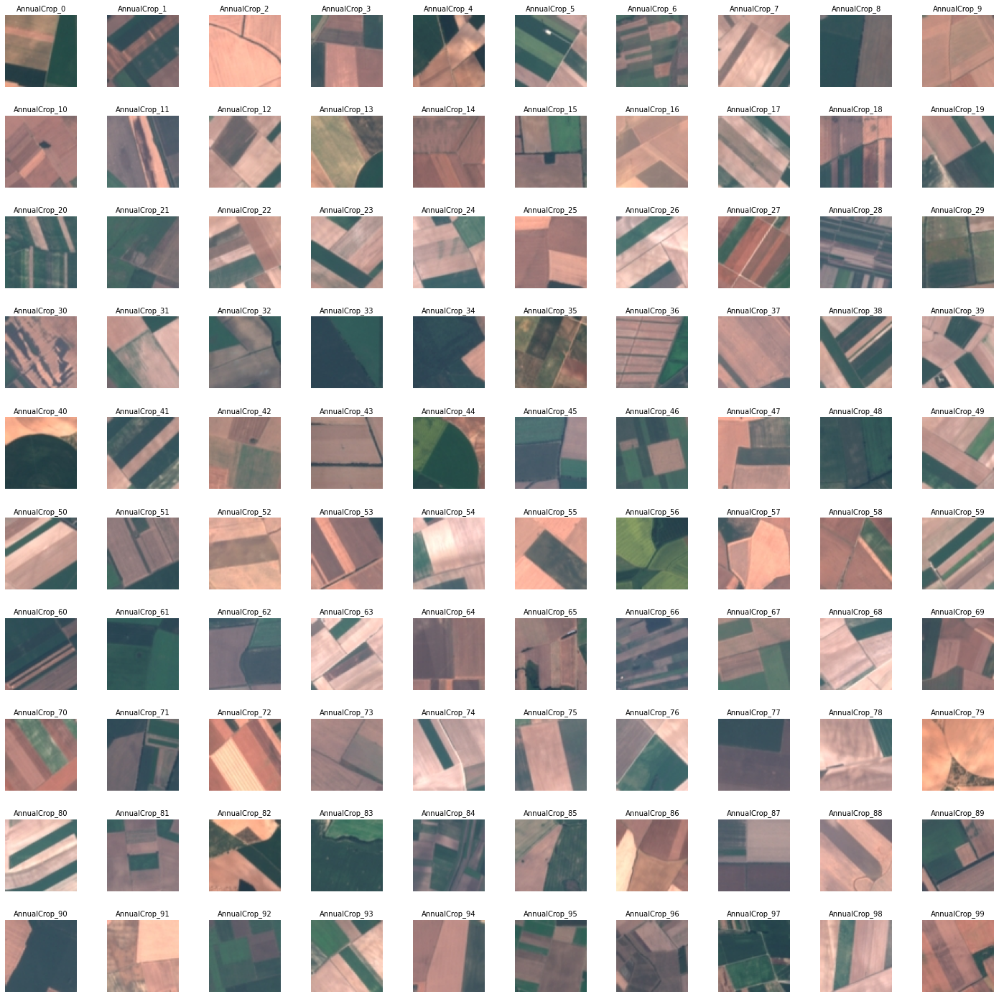

In [ ]:
service.displayImagesOfCategory("AnnualCrop")

### Display images of Forest

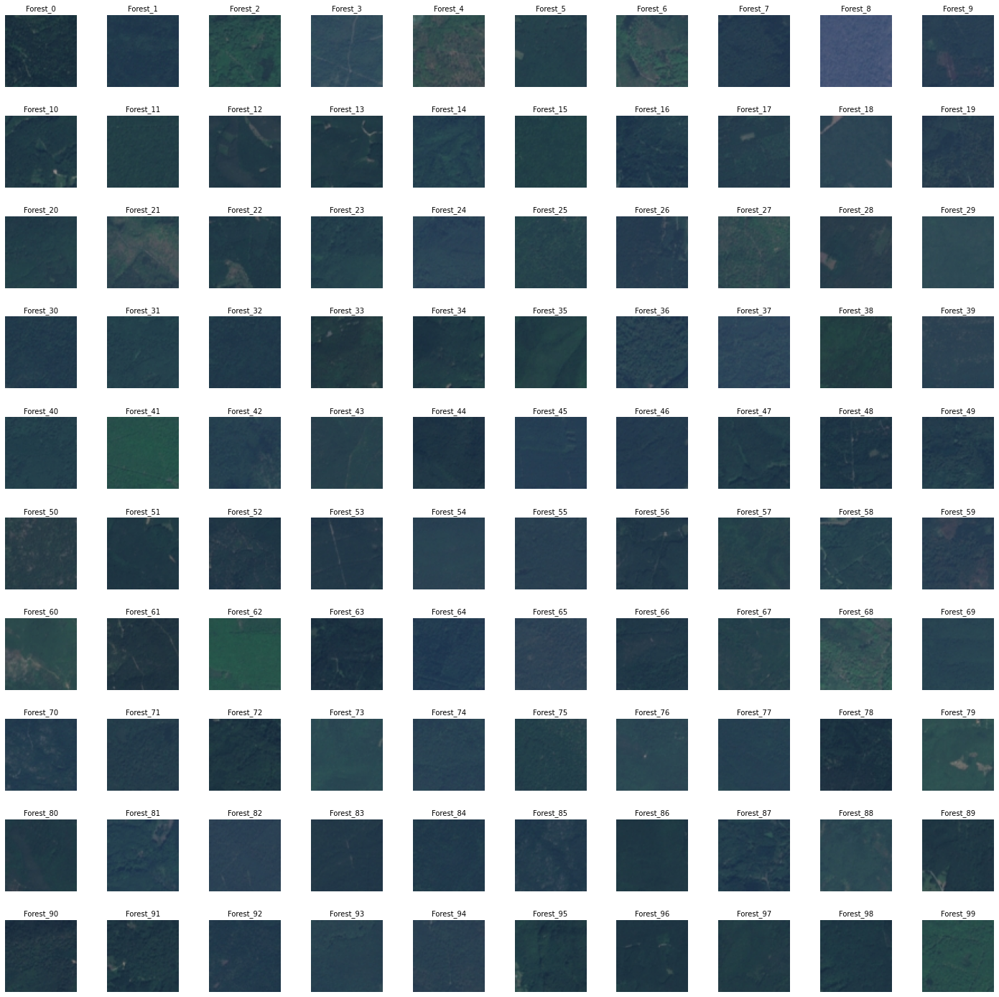

In [ ]:
service.displayImagesOfCategory("Forest")

### Display images of HerbaceousVegetation

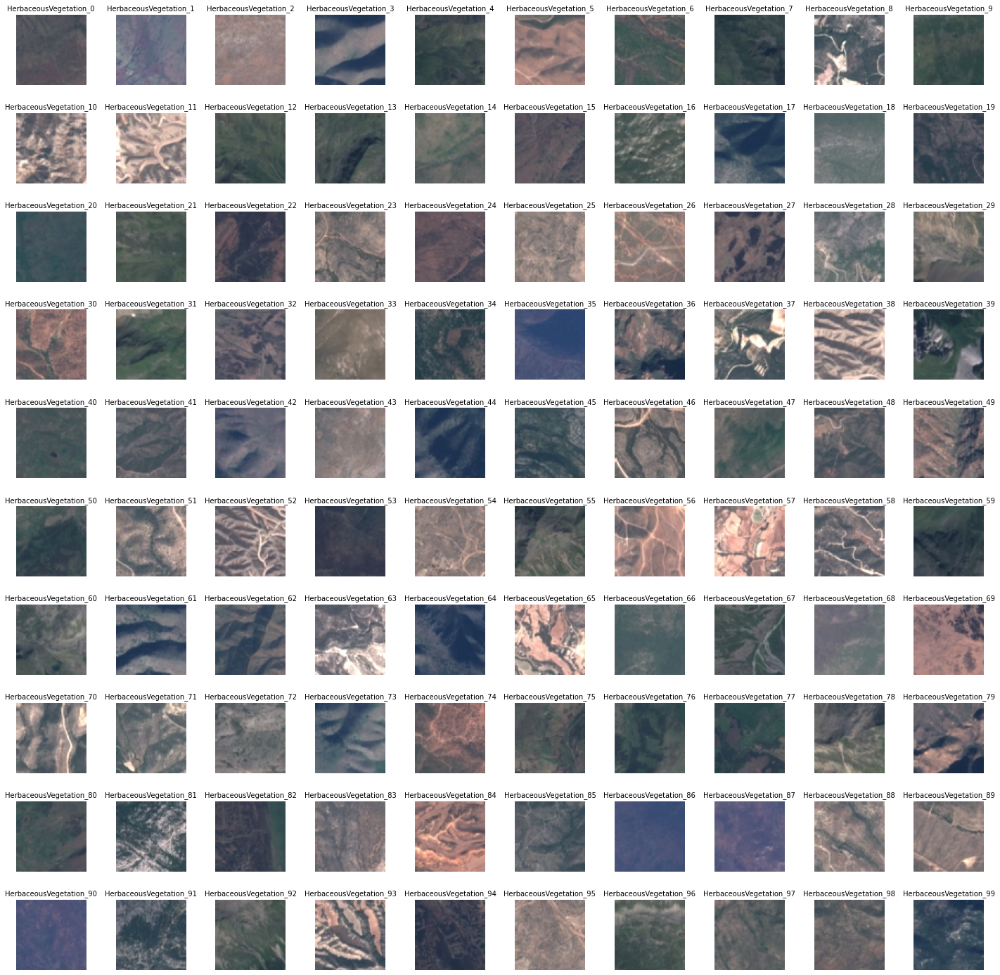

In [ ]:
service.displayImagesOfCategory("HerbaceousVegetation")

### Display images of Highway

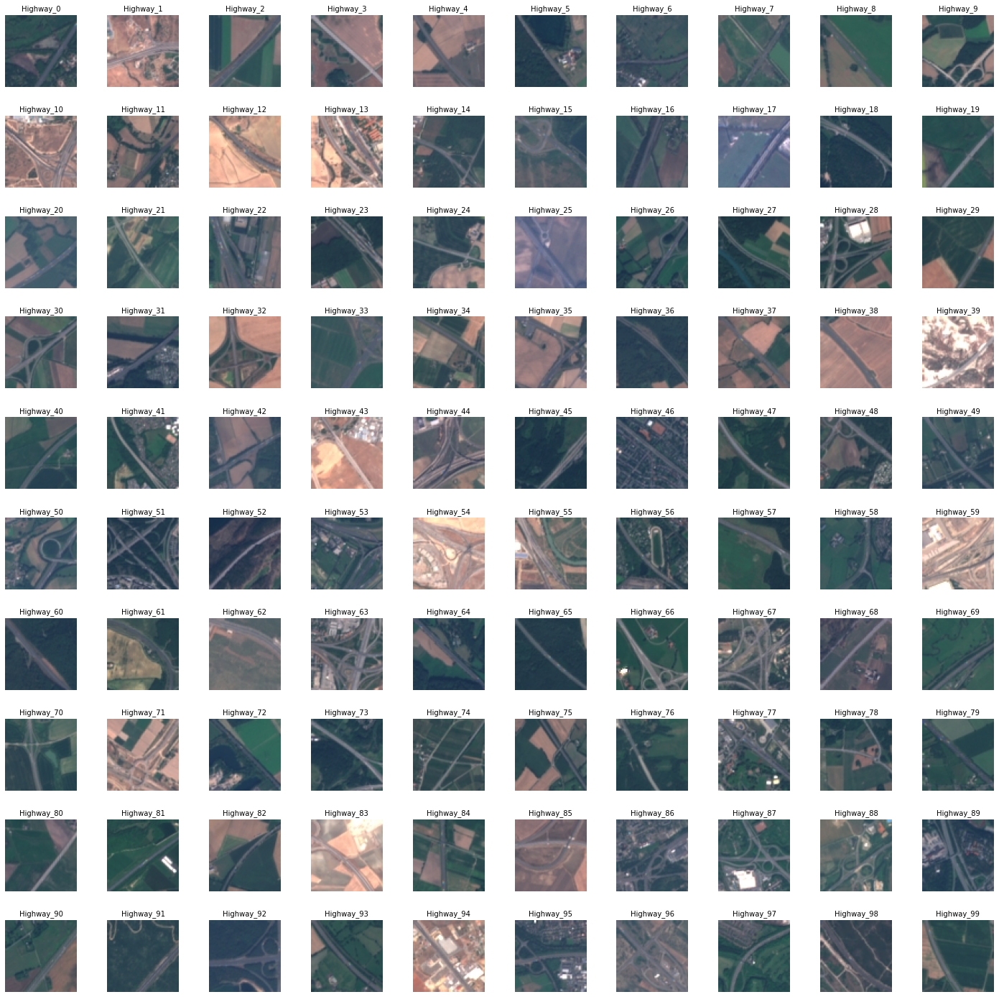

In [ ]:
service.displayImagesOfCategory("Highway")

### Display images of Industrial

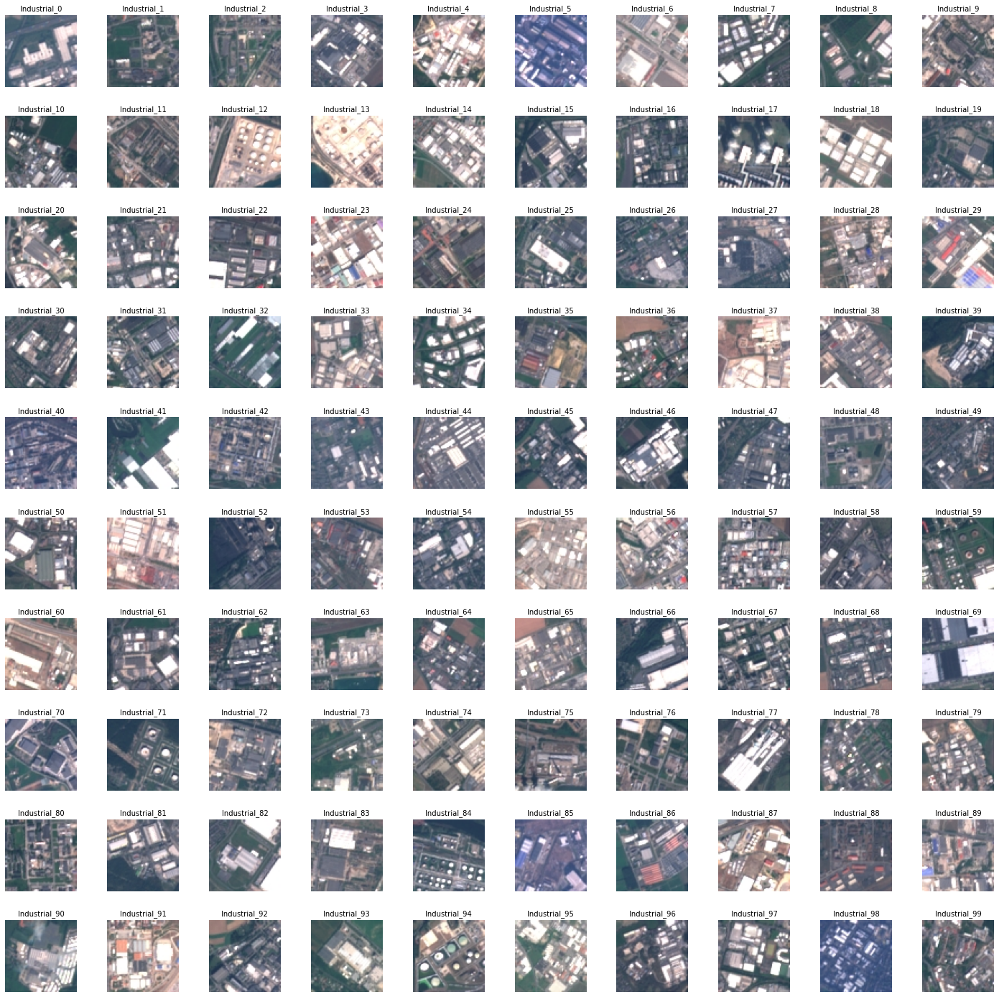

In [ ]:
service.displayImagesOfCategory("Industrial")

### Display images of Pasture

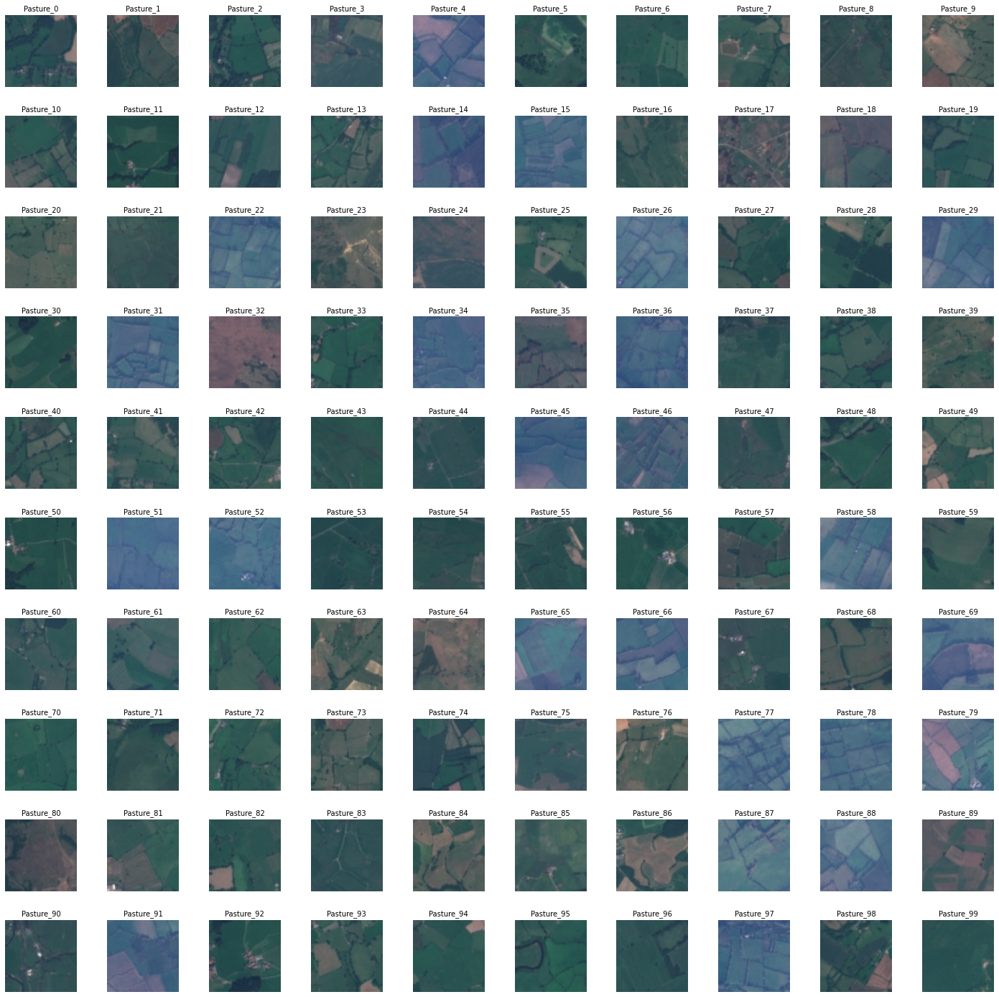

In [ ]:
service.displayImagesOfCategory("Pasture")

### Display images of PermanentCrop

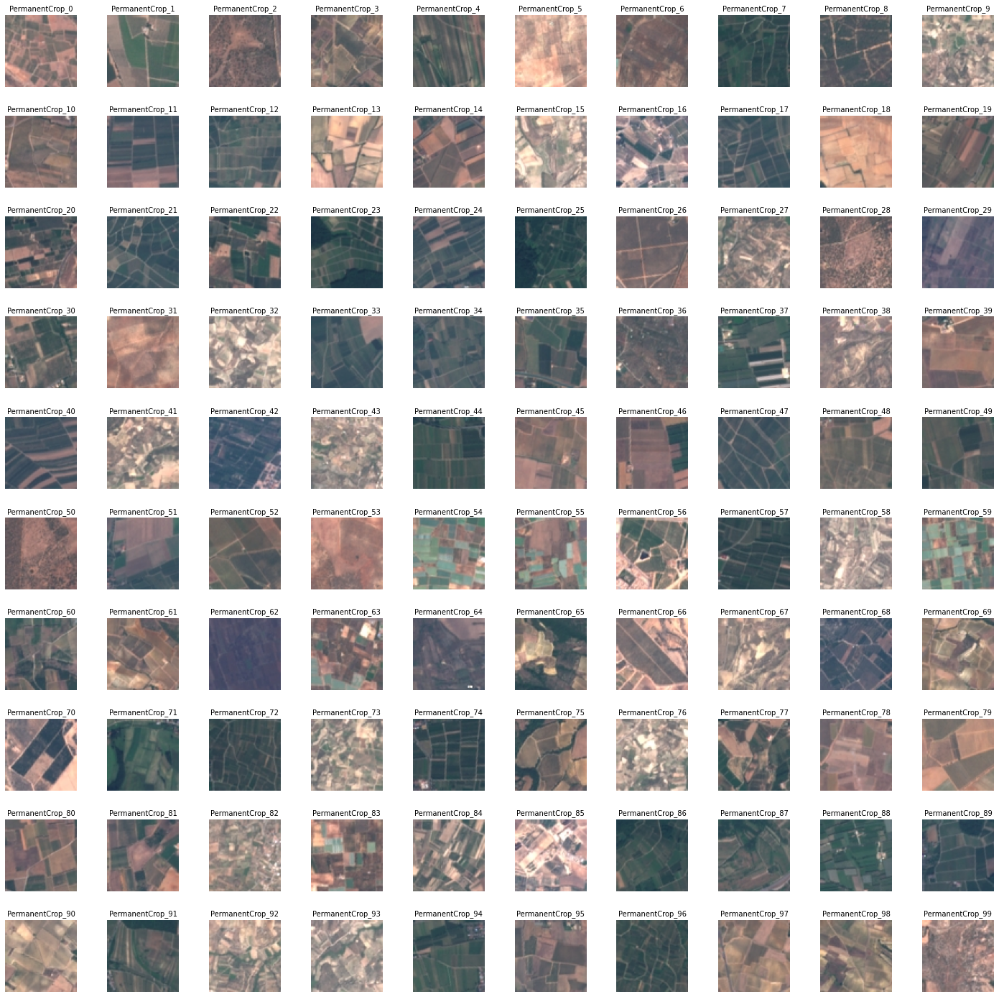

In [ ]:
service.displayImagesOfCategory("PermanentCrop")

### Display images of Residential

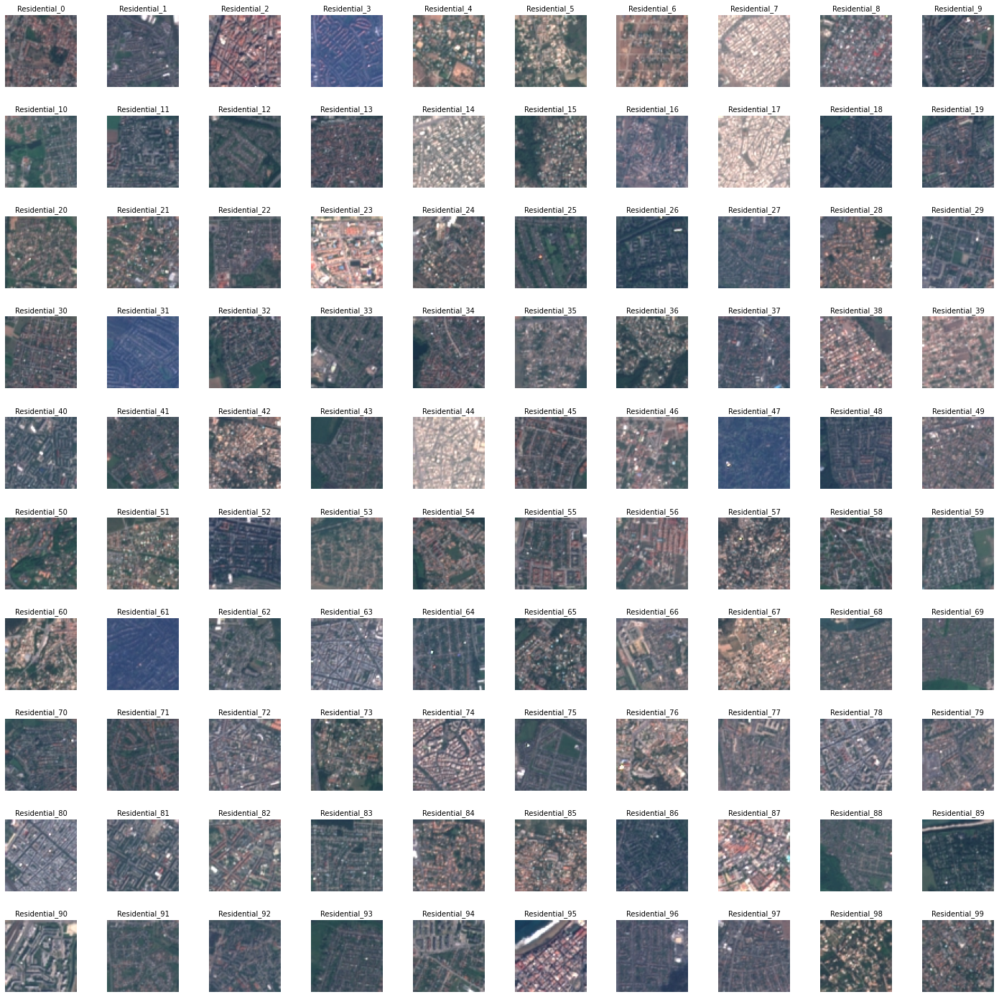

In [ ]:
service.displayImagesOfCategory("Residential")

### Display images of River

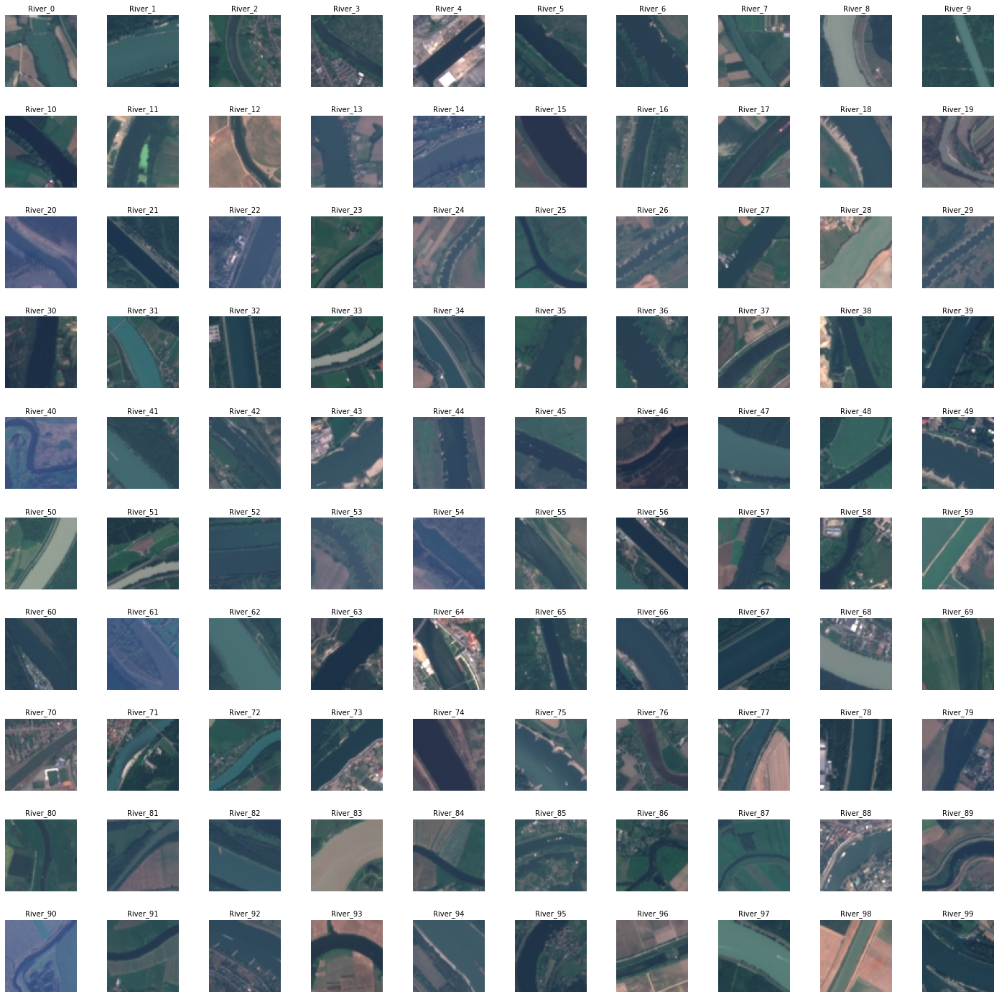

In [ ]:
service.displayImagesOfCategory("River")

### Display images of SeaLake

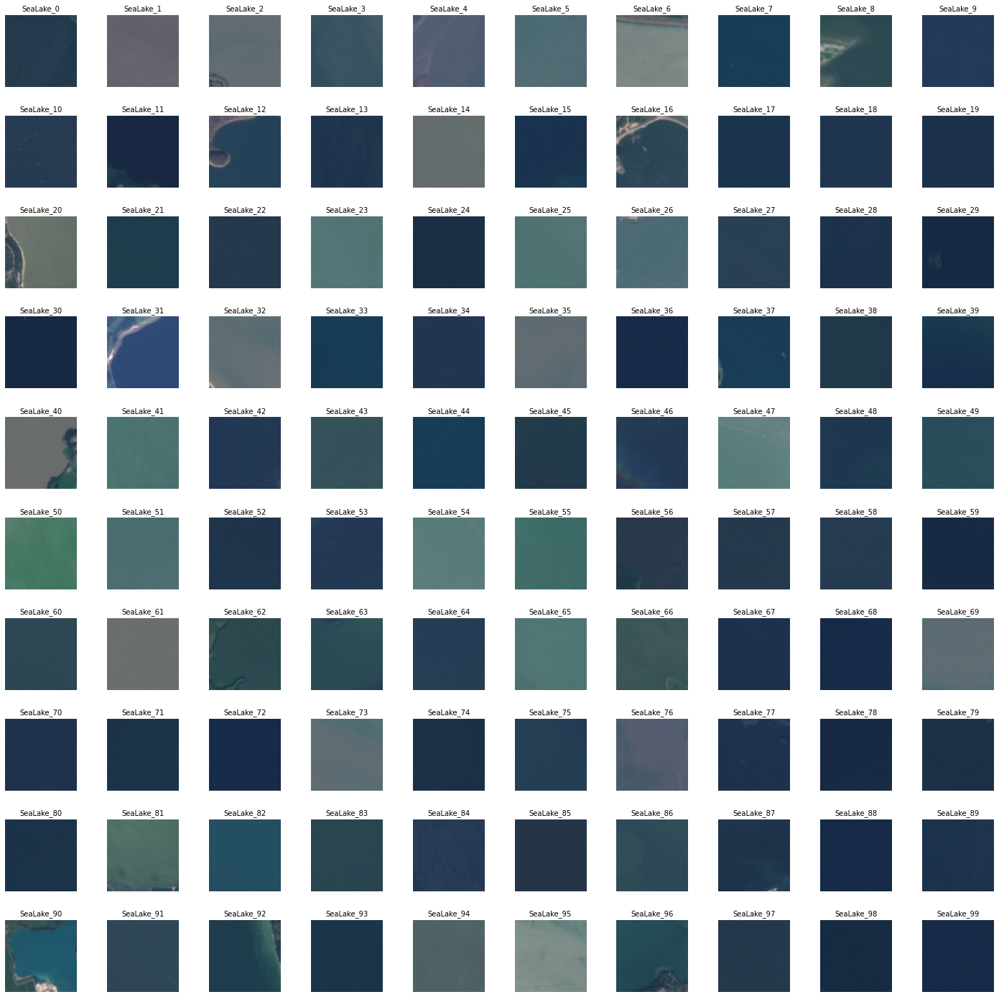

In [ ]:
service.displayImagesOfCategory("SeaLake")

# **Distribution analysis**

### Histogram

In [ ]:
service.displayFrequencyHistogram()

### Tables

In [ ]:
df = service.get_data_frame_of_frequency()

In [ ]:
df.sort_values(by="Percent", ignore_index=True)

,Category,Number of images,Percent,Total images
0,Pasture,2000,7.41,27000
1,Industrial,2500,9.26,27000
2,PermanentCrop,2500,9.26,27000
3,Highway,2500,9.26,27000
4,River,2500,9.26,27000
5,AnnualCrop,3000,11.11,27000
6,HerbaceousVegetation,3000,11.11,27000
7,SeaLake,3000,11.11,27000
8,Residential,3000,11.11,27000
9,Forest,3000,11.11,27000


In [ ]:
df.describe()

,Number of images,Percent,Total images
count,10.000000,10.000000,10.0
mean,2700.000000,10.000000,27000.0
std,349.602949,1.293531,0.0
min,2000.000000,7.410000,27000.0
25%,2500.000000,9.260000,27000.0
50%,2750.000000,10.185000,27000.0
75%,3000.000000,11.110000,27000.0
max,3000.000000,11.110000,27000.0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Category          10 non-null     object 
 1   Number of images  10 non-null     int64  
 2   Percent           10 non-null     float64
 3   Total images      10 non-null     int64  
dtypes: float64(1), int64(2), object(1)
memory usage: 448.0+ bytes


# **ML development**

### Split the data

We will split the data like this:

 0 - Annual Crop

 1 - Forest

 2 - HerbaceousVegetation

 3 - Highway

 4 - Industrial

 5 - Pasture

 6 - PermanentCrop

 7 - Residential

 8 - River
 
 9 - SeaLake

In [ ]:
percent_train = 0.8
percent_val = 0.1
percent_test = 0.1

In [ ]:
annualCrop_imgs = service.find("AnnualCrop").getCategoryImages()
forest_imgs = service.find("Forest").getCategoryImages()
herbaceousVegetation_imgs = service.find("HerbaceousVegetation").getCategoryImages()
highway_imgs = service.find("Highway").getCategoryImages()
industrial_imgs = service.find("Industrial").getCategoryImages()
pasture_imgs = service.find("Pasture").getCategoryImages()
permanentCrop_imgs = service.find("PermanentCrop").getCategoryImages()
residential_imgs = service.find("Residential").getCategoryImages()
river_imgs = service.find("River").getCategoryImages()
sealake_imgs  = service.find("SeaLake").getCategoryImages()

imgs = [annualCrop_imgs, forest_imgs, herbaceousVegetation_imgs, highway_imgs, industrial_imgs, pasture_imgs, permanentCrop_imgs, residential_imgs, river_imgs, sealake_imgs]

In [ ]:
X_train = []
y_train = []

X_val = []
y_val = []

X_test = []
y_test = []

i = 0
for set_imgs in imgs:
  train_index = int(len(set_imgs) * percent_train)
  val_index = int(len(set_imgs) * (percent_train + percent_val))
  test_index = int(len(set_imgs) * (percent_train + percent_val + percent_test))

  X_train += set_imgs[:train_index]
  X_val += set_imgs[train_index + 1: val_index]
  X_test += set_imgs[val_index + 1: test_index]

  y_train += [i for k in range(len(set_imgs[:train_index]))]
  y_val += [i for k in range(len(set_imgs[train_index + 1: val_index]))]
  y_test += [i for k in range(len(set_imgs[val_index + 1: test_index]))]

  i += 1

X_train = np.asarray(X_train, dtype="float32")
y_train = np.asarray(y_train, dtype="float32")

X_val = np.asarray(X_val, dtype="float32")
y_val = np.asarray(y_val, dtype="float32")

X_test = np.asarray(X_test, dtype="float32")
y_test = np.asarray(y_test, dtype="float32")

#### Check the distributions of classes 

In [ ]:
fig = go.Figure()

x = ["Train", "Val", "Test"]

fig.add_trace(go.Bar(
    x = x,
    y = [len([0 for i in y_train if i == 0]), len([0 for i in y_val if i == 0]), len([0 for i in y_test if i == 0])],
    name='AnnualCrop',
))

fig.add_trace(go.Bar(
    x = x,
    y = [len([0 for i in y_train if i == 1]), len([0 for i in y_val if i == 1]), len([0 for i in y_test if i == 1])],
    name='Forest',
))

fig.add_trace(go.Bar(
    x = x,
    y = [len([0 for i in y_train if i == 2]), len([0 for i in y_val if i == 2]), len([0 for i in y_test if i == 2])],
    name='HerbaceousVegetation',
))

fig.add_trace(go.Bar(
    x = x,
    y = [len([0 for i in y_train if i == 3]), len([0 for i in y_val if i == 3]), len([0 for i in y_test if i == 3])],
    name='Highway',
))

fig.add_trace(go.Bar(
    x = x,
    y = [len([0 for i in y_train if i == 4]), len([0 for i in y_val if i == 4]), len([0 for i in y_test if i == 4])],
    name='Industrial',
))

fig.add_trace(go.Bar(
    x = x,
    y = [len([0 for i in y_train if i == 5]), len([0 for i in y_val if i == 5]), len([0 for i in y_test if i == 5])],
    name='Pasture',
))

fig.add_trace(go.Bar(
    x = x,
    y = [len([0 for i in y_train if i == 6]), len([0 for i in y_val if i == 6]), len([0 for i in y_test if i == 6])],
    name='PermanentCrop',
))

fig.add_trace(go.Bar(
    x = x,
    y = [len([0 for i in y_train if i == 7]), len([0 for i in y_val if i == 7]), len([0 for i in y_test if i == 7])],
    name='Residential',
))

fig.add_trace(go.Bar(
    x = x,
    y = [len([0 for i in y_train if i == 8]), len([0 for i in y_val if i == 8]), len([0 for i in y_test if i == 8])],
    name='River',
))

fig.add_trace(go.Bar(
    x = x,
    y = [len([0 for i in y_train if i == 9]), len([0 for i in y_val if i == 9]), len([0 for i in y_test if i == 9])],
    name='SeaLake',
))

fig.update_layout(barmode='group', xaxis_tickangle=-45, showlegend=True)
fig.show()

### Model

#### Architecture

In [ ]:
class BasicBlock(tf.keras.layers.Layer):

    def __init__(self, filter_num, stride=1):
        super(BasicBlock, self).__init__()
        self.conv1 = tf.keras.layers.Conv2D(filters=filter_num,
                                            kernel_size=(3, 3),
                                            strides=stride,
                                            padding="same")
        self.bn1 = tf.keras.layers.BatchNormalization()
        self.conv2 = tf.keras.layers.Conv2D(filters=filter_num,
                                            kernel_size=(3, 3),
                                            strides=1,
                                            padding="same")
        self.bn2 = tf.keras.layers.BatchNormalization()
        if stride != 1:
            self.downsample = tf.keras.Sequential()
            self.downsample.add(tf.keras.layers.Conv2D(filters=filter_num,
                                                       kernel_size=(1, 1),
                                                       strides=stride))
            self.downsample.add(tf.keras.layers.BatchNormalization())
        else:
            self.downsample = lambda x: x

    def call(self, inputs, training=None, **kwargs):
        residual = self.downsample(inputs)

        x = self.conv1(inputs)
        x = self.bn1(x, training=training)
        x = tf.nn.relu(x)
        x = self.conv2(x)
        x = self.bn2(x, training=training)

        output = tf.nn.relu(tf.keras.layers.add([residual, x]))

        return output


class BottleNeck(tf.keras.layers.Layer):
    def __init__(self, filter_num, stride=1):
        super(BottleNeck, self).__init__()
        self.conv1 = tf.keras.layers.Conv2D(filters=filter_num,
                                            kernel_size=(1, 1),
                                            strides=1,
                                            padding='same')
        self.bn1 = tf.keras.layers.BatchNormalization()
        self.conv2 = tf.keras.layers.Conv2D(filters=filter_num,
                                            kernel_size=(3, 3),
                                            strides=stride,
                                            padding='same')
        self.bn2 = tf.keras.layers.BatchNormalization()
        self.conv3 = tf.keras.layers.Conv2D(filters=filter_num * 4,
                                            kernel_size=(1, 1),
                                            strides=1,
                                            padding='same')
        self.bn3 = tf.keras.layers.BatchNormalization()

        self.downsample = tf.keras.Sequential()
        self.downsample.add(tf.keras.layers.Conv2D(filters=filter_num * 4,
                                                   kernel_size=(1, 1),
                                                   strides=stride))
        self.downsample.add(tf.keras.layers.BatchNormalization())

    def call(self, inputs, training=None, **kwargs):
        residual = self.downsample(inputs)

        x = self.conv1(inputs)
        x = self.bn1(x, training=training)
        x = tf.nn.relu(x)
        x = self.conv2(x)
        x = self.bn2(x, training=training)
        x = tf.nn.relu(x)
        x = self.conv3(x)
        x = self.bn3(x, training=training)

        output = tf.nn.relu(tf.keras.layers.add([residual, x]))

        return output


def make_basic_block_layer(filter_num, blocks, stride=1):
    res_block = tf.keras.Sequential()
    res_block.add(BasicBlock(filter_num, stride=stride))

    for _ in range(1, blocks):
        res_block.add(BasicBlock(filter_num, stride=1))

    return res_block


def make_bottleneck_layer(filter_num, blocks, stride=1):
    res_block = tf.keras.Sequential()
    res_block.add(BottleNeck(filter_num, stride=stride))

    for _ in range(1, blocks):
        res_block.add(BottleNeck(filter_num, stride=1))

    return res_block

In [ ]:
class ResNet(tf.keras.Model):
    def __init__(self, layer_params):
        super(ResNet, self).__init__()
        self.conv1 = tf.keras.layers.Conv2D(filters=64,
                                            kernel_size=(7, 7),
                                            strides=2,
                                            padding="same")
        self.bn1 = tf.keras.layers.BatchNormalization()
        self.pool1 = tf.keras.layers.MaxPool2D(pool_size=(3, 3),
                                               strides=2,
                                               padding="same")

        self.layer1 = make_bottleneck_layer(filter_num=64,
                                            blocks=layer_params[0])
        self.layer2 = make_bottleneck_layer(filter_num=128,
                                            blocks=layer_params[1],
                                            stride=2)
        self.layer3 = make_bottleneck_layer(filter_num=256,
                                            blocks=layer_params[2],
                                            stride=2)
        self.layer4 = make_bottleneck_layer(filter_num=512,
                                            blocks=layer_params[3],
                                            stride=2)

        self.avgpool = tf.keras.layers.GlobalAveragePooling2D()
        self.fc = tf.keras.layers.Dense(units=10, activation=tf.keras.activations.softmax)

    def call(self, inputs, training=None, mask=None):
        x = self.conv1(inputs)
        x = self.bn1(x, training=training)
        x = tf.nn.relu(x)
        x = self.pool1(x)
        x = self.layer1(x, training=training)
        x = self.layer2(x, training=training)
        x = self.layer3(x, training=training)
        x = self.layer4(x, training=training)
        x = self.avgpool(x)
        output = self.fc(x)

        return output

def resnet_50():
    return ResNet(layer_params=[3, 4, 6, 3])
model = resnet_50()

#### Build

In [ ]:
model.build(input_shape=(None, 64, 64, 3))

#### Summary

In [ ]:
model.summary()

Model: "res_net_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_130 (Conv2D)          multiple                  9472      
_________________________________________________________________
batch_normalization_130 (Bat multiple                  256       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 multiple                  0         
_________________________________________________________________
sequential_40 (Sequential)   multiple                  353664    
_________________________________________________________________
sequential_44 (Sequential)   multiple                  2024448   
_________________________________________________________________
sequential_49 (Sequential)   multiple                  12397568  
_________________________________________________________________
sequential_56 (Sequential)   multiple                  23

### Train

In [ ]:
tf.keras.backend.clear_session()

In [ ]:
# SGD optimizer
sgd_optimizer = tf.optimizers.SGD(learning_rate=0.01,  momentum=0.9)

model.compile(
    optimizer = sgd_optimizer,
    loss = "sparse_categorical_crossentropy",
    metrics = ['accuracy']
)

In [ ]:
checkpoint = ModelCheckpoint("/content/model.h5", monitor='val_accuracy', verbose=2, save_best_only=True, mode='max')

In [ ]:
history = model.fit(
    x = X_train, 
    y = y_train, 
    validation_data = (X_val, y_val),
    batch_size = 128,
    verbose = 1,
    epochs = 10,
    callbacks = [checkpoint]
  )

Epoch 1/10
169/169 [==============================] - ETA: 0s - loss: 0.1152 - accuracy: 0.9612
Epoch 00001: val_accuracy improved from -inf to 0.83755, saving model to /content/model.h5
169/169 [==============================] - 24s 141ms/step - loss: 0.1152 - accuracy: 0.9612 - val_loss: 0.5081 - val_accuracy: 0.8375
Epoch 2/10
169/169 [==============================] - ETA: 0s - loss: 0.0703 - accuracy: 0.9774
Epoch 00002: val_accuracy improved from 0.83755 to 0.85056, saving model to /content/model.h5
169/169 [==============================] - 23s 134ms/step - loss: 0.0703 - accuracy: 0.9774 - val_loss: 0.5429 - val_accuracy: 0.8506
Epoch 3/10
169/169 [==============================] - ETA: 0s - loss: 0.0537 - accuracy: 0.9813
Epoch 00003: val_accuracy did not improve from 0.85056
169/169 [==============================] - 22s 131ms/step - loss: 0.0537 - accuracy: 0.9813 - val_loss: 0.7329 - val_accuracy: 0.8379
Epoch 4/10
169/169 [==============================] - ETA: 0s - loss: 

### Evaluation

In [ ]:
x = np.arange(10)

fig = go.Figure()

fig.add_trace(go.Scatter(x=x, y= history.history['accuracy'], name="Train"))
fig.add_trace(go.Scatter(x=x, y= history.history['val_accuracy'], name="Validation"))

fig.show()

In [ ]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=x, y= history.history['loss'], name="Train"))
fig.add_trace(go.Scatter(x=x, y= history.history['val_loss'], name="Validation"))

fig.show()

In [ ]:
model.load_weights("/content/drive/My Drive/satellite_images/model.h5")

In [ ]:
# Get the accuracy and loss on test set
loss, acc = model.evaluate(X_test,  y_test,batch_size=128, verbose=2)
print('Model, accuracy: {:5.2f}%'.format(100*acc))

22/22 - 1s - loss: 0.6990 - accuracy: 0.8550
Model, accuracy: 85.50%


In [ ]:
y_pred = model.predict(X_test,batch_size=128,verbose=1)

22/22 [==============================] - 1s 38ms/step


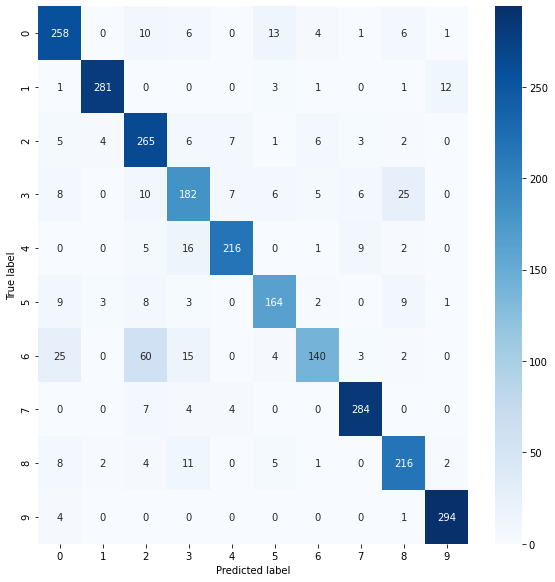

In [ ]:
# Get the confusion matrix
conf_matrix = metrics.confusion_matrix(y_test, y_pred.argmax(axis = 1))

# Plot the confusion matrix
figure = plt.figure(figsize=(8, 8))
sns.heatmap(conf_matrix, annot=True,cmap=plt.cm.Blues, fmt="d")
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [ ]:
# Print the classification Report
class_names = ['AnnualCrop', 'Forest','HerbaceousVegetation', 'Highway', 'Industrial', 'Pasture', 'PermanentCrop', 'Residential', 'River', 'SeaLake']
print(metrics.classification_report(y_test, y_pred.argmax(axis=1), target_names=class_names))

                      precision    recall  f1-score   support

          AnnualCrop       0.81      0.86      0.84       299
              Forest       0.97      0.94      0.95       299
HerbaceousVegetation       0.72      0.89      0.79       299
             Highway       0.75      0.73      0.74       249
          Industrial       0.92      0.87      0.89       249
             Pasture       0.84      0.82      0.83       199
       PermanentCrop       0.88      0.56      0.68       249
         Residential       0.93      0.95      0.94       299
               River       0.82      0.87      0.84       249
             SeaLake       0.95      0.98      0.97       299

            accuracy                           0.86      2690
           macro avg       0.86      0.85      0.85      2690
        weighted avg       0.86      0.86      0.85      2690

